In [2]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import seaborn as sns
from matplotlib.patches import Ellipse
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.transforms as transforms

# plot setting
plt.rcParams['font.family']='Arial'

bar_width=0.25
plt.rc('axes', labelsize=11)
plt.rc('xtick', labelsize=8) 
plt.rc('ytick', labelsize=8) 
plt.rc('legend', fontsize=8)
plt.rc('figure', titlesize=28) 
title_size = 25
label_size = 14
point_alpha = 0.8

color_vs = ['#E881A6', '#6EA1D4']
color_year2 = ['#FFBE98', '#FFA74F', '#E881A6', '#60C8B3', '#6EA1D4']
color_year = ['#EFCFBA', '#FFB2A5', '#FA9A85',  '#DE8286', '#F97272']

set_dpi=300

figure_path = '/Users/gogyeongtae/Library/CloudStorage/Dropbox/KNU_Lab_Research/2023_ASF/Submission/20240601_Frontiers_Revision_1st/Figure/'
gpd_file_path = '../Data/'
gpd_file_name = 'sig_5179.shp'
loc_file_name = 'ASF_WildBoar_Update.csv'

location = pd.read_csv(gpd_file_path + loc_file_name)
korea = gpd.read_file(gpd_file_path + gpd_file_name)

korea = korea.to_crs(epsg=4326)

# error correction
location.loc[location['경도'].str[-2] == '.','경도'] = 128.3489
location['위도'] = location['위도'].str.replace(',', '')
location['경도'] = location['경도'].astype(float)
location['위도'] = location['위도'].astype(float)

location['확진'] = pd.to_datetime(location['확진'], format = '%Y-%m-%d')
location = location.rename(columns = {'위도' : 'y', '경도' : 'x'}, inplace  = False)

# Year
location_2019 = location.query('확진 < "2020-01-01"')
location_2020 = location.query('확진 >= "2020-01-01" & 확진 < "2021-01-01"')
location_2021 = location.query('확진 >= "2021-01-01" & 확진 < "2022-01-01"')
location_2022 = location.query('확진 >= "2022-01-01" & 확진 < "2023-01-01"')
location_2023 = location.query('확진 >= "2023-01-01" & 확진 < "2024-01-01"')

# 2022년 포아송
## : 47930(울진군), 43130(충주시), 42130(원주시)

# 2022년 NB
## : 47930(울진군), 47770(영덕군), 47250(상주시)

# 2022년 ZF
## : 43150(제천시), 43800(단양군), 42230(삼척시), 47930(울진군)

# 2023년 포아송
## : 47930(울진군), 42130(원주시), 43130(충주시)

# 2023년 NB
## : 47930(울진군), 47770(영덕군), 42780(철원군), 42790(화천군)

# 2023년 ZF
## : 43150(제천시), 43800(단양군), 42230(삼척시), 47930(울진군)

# Results for scanstatistic
korea.loc[korea['SIG_CD'] == '47280', '2022_car_PS'] = 6
korea.loc[korea['SIG_CD'] == '43130', '2022_car_PS'] = 3
korea.loc[korea['SIG_CD'] == '42130', '2022_car_PS'] = 2
korea.loc[korea['SIG_CD'] == '47250', '2022_car_PS'] = 2
korea.loc[korea['SIG_CD'] == '47920', '2022_car_PS'] = 1

# Infected for period1
korea.loc[korea['SIG_CD'] == '47280', '2022_infected'] = 8
korea.loc[korea['SIG_CD'] == '43130', '2022_infected'] = 4
korea.loc[korea['SIG_CD'] == '42130', '2022_infected'] = 3
korea.loc[korea['SIG_CD'] == '47250', '2022_infected'] = 3
korea.loc[korea['SIG_CD'] == '47920', '2022_infected'] = 2
korea.loc[korea['SIG_CD'] == '42190', '2022_infected'] = 1

korea.loc[korea['SIG_CD'] == '47280', '2022_car_PS_error1'] = 6
korea.loc[korea['SIG_CD'] == '43130', '2022_car_PS_error1'] = 3
korea.loc[korea['SIG_CD'] == '42130', '2022_car_PS_error1'] = 2
korea.loc[korea['SIG_CD'] == '47250', '2022_car_PS_error1'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2022_car_PS_error1'] = 1

korea.loc[korea['SIG_CD'] == '47280', '2022_car_PS_error2'] = 6
korea.loc[korea['SIG_CD'] == '43130', '2022_car_PS_error2'] = 2
korea.loc[korea['SIG_CD'] == '42130', '2022_car_PS_error2'] = 2
korea.loc[korea['SIG_CD'] == '47250', '2022_car_PS_error2'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2022_car_PS_error2'] = 1

korea.loc[korea['SIG_CD'] == '47280', '2022_car_PS_error3'] = 5
korea.loc[korea['SIG_CD'] == '43130', '2022_car_PS_error3'] = 2
korea.loc[korea['SIG_CD'] == '42130', '2022_car_PS_error3'] = 1
korea.loc[korea['SIG_CD'] == '47250', '2022_car_PS_error3'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2022_car_PS_error3'] = 1

korea.loc[korea['SIG_CD'] == '47280', '2022_car_NB'] = 5
korea.loc[korea['SIG_CD'] == '43130', '2022_car_NB'] = 1
korea.loc[korea['SIG_CD'] == '42130', '2022_car_NB'] = 1
korea.loc[korea['SIG_CD'] == '47250', '2022_car_NB'] = 1

korea.loc[korea['SIG_CD'] == '47280', '2022_car_NB_error1'] = 5
korea.loc[korea['SIG_CD'] == '43130', '2022_car_NB_error1'] = 1
korea.loc[korea['SIG_CD'] == '42130', '2022_car_NB_error1'] = 1
korea.loc[korea['SIG_CD'] == '47250', '2022_car_NB_error1'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2022_car_NB_error1'] = 1

korea.loc[korea['SIG_CD'] == '47280', '2022_car_NB_error2'] = 5
korea.loc[korea['SIG_CD'] == '43130', '2022_car_NB_error2'] = 1
korea.loc[korea['SIG_CD'] == '42130', '2022_car_NB_error2'] = 1
korea.loc[korea['SIG_CD'] == '47250', '2022_car_NB_error2'] = 1

korea.loc[korea['SIG_CD'] == '47280', '2022_car_NB_error3'] = 0
korea.loc[korea['SIG_CD'] == '47250', '2022_car_NB_error3'] = 0

korea.loc[korea['SIG_CD'] == '47280', '2022_car_ZIP'] = 6
korea.loc[korea['SIG_CD'] == '43130', '2022_car_ZIP'] = 3
korea.loc[korea['SIG_CD'] == '47920', '2022_car_ZIP'] = 3
korea.loc[korea['SIG_CD'] == '42130', '2022_car_ZIP'] = 2
korea.loc[korea['SIG_CD'] == '47250', '2022_car_ZIP'] = 2

korea.loc[korea['SIG_CD'] == '47280', '2022_car_ZIP_error1'] = 6
korea.loc[korea['SIG_CD'] == '43130', '2022_car_ZIP_error1'] = 3
korea.loc[korea['SIG_CD'] == '47920', '2022_car_ZIP_error1'] = 3
korea.loc[korea['SIG_CD'] == '42130', '2022_car_ZIP_error1'] = 2
korea.loc[korea['SIG_CD'] == '47250', '2022_car_ZIP_error1'] = 2

korea.loc[korea['SIG_CD'] == '47280', '2022_car_ZIP_error2'] = 6
korea.loc[korea['SIG_CD'] == '43130', '2022_car_ZIP_error2'] = 3
korea.loc[korea['SIG_CD'] == '42130', '2022_car_ZIP_error2'] = 2
korea.loc[korea['SIG_CD'] == '47920', '2022_car_ZIP_error2'] = 3
korea.loc[korea['SIG_CD'] == '47250', '2022_car_ZIP_error2'] = 2

korea.loc[korea['SIG_CD'] == '47280', '2022_car_ZIP_error3'] = 6
korea.loc[korea['SIG_CD'] == '43130', '2022_car_ZIP_error3'] = 3
korea.loc[korea['SIG_CD'] == '42130', '2022_car_ZIP_error3'] = 2
korea.loc[korea['SIG_CD'] == '47920', '2022_car_ZIP_error3'] = 1
korea.loc[korea['SIG_CD'] == '47250', '2022_car_ZIP_error3'] = 1

korea['2022_car_NB'] = korea['2022_car_NB'].fillna(0, inplace = False)
korea['2022_car_ZIP'] = korea['2022_car_ZIP'].fillna(0, inplace = False)
korea['2022_car_PS'] = korea['2022_car_PS'].fillna(0, inplace = False)


korea.loc[korea['SIG_CD'] == '42130', '2023_car_PS'] = 10
korea.loc[korea['SIG_CD'] == '42230', '2023_car_PS'] = 7
korea.loc[korea['SIG_CD'] == '43130', '2023_car_PS'] = 7
korea.loc[korea['SIG_CD'] == '43800', '2023_car_PS'] = 7
korea.loc[korea['SIG_CD'] == '47250', '2023_car_PS'] = 6
korea.loc[korea['SIG_CD'] == '47930', '2023_car_PS'] = 6
korea.loc[korea['SIG_CD'] == '42190', '2023_car_PS'] = 3
korea.loc[korea['SIG_CD'] == '47210', '2023_car_PS'] = 2
korea.loc[korea['SIG_CD'] == '42750', '2023_car_PS'] = 2
korea.loc[korea['SIG_CD'] == '47900', '2023_car_PS'] = 2
korea.loc[korea['SIG_CD'] == '42730', '2023_car_PS'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2023_car_PS'] = 1

korea.loc[korea['SIG_CD'] == '42130', '2023_infected'] = 13
korea.loc[korea['SIG_CD'] == '42230', '2023_infected'] = 10
korea.loc[korea['SIG_CD'] == '43130', '2023_infected'] = 10
korea.loc[korea['SIG_CD'] == '43800', '2023_infected'] = 10
korea.loc[korea['SIG_CD'] == '47250', '2023_infected'] = 10
korea.loc[korea['SIG_CD'] == '47930', '2023_infected'] = 7
korea.loc[korea['SIG_CD'] == '42190', '2023_infected'] = 6
korea.loc[korea['SIG_CD'] == '47280', '2023_infected'] = 4
korea.loc[korea['SIG_CD'] == '47920', '2023_infected'] = 4
korea.loc[korea['SIG_CD'] == '42750', '2023_infected'] = 4
korea.loc[korea['SIG_CD'] == '47210', '2023_infected'] = 3
korea.loc[korea['SIG_CD'] == '47770', '2023_infected'] = 3
korea.loc[korea['SIG_CD'] == '47900', '2023_infected'] = 3
korea.loc[korea['SIG_CD'] == '42730', '2023_infected'] = 2
korea.loc[korea['SIG_CD'] == '43760', '2023_infected'] = 2
korea.loc[korea['SIG_CD'] == '41800', '2023_infected'] = 1
korea.loc[korea['SIG_CD'] == '42780', '2023_infected'] = 1
korea.loc[korea['SIG_CD'] == '42790', '2023_infected'] = 1
korea.loc[korea['SIG_CD'] == '43150', '2023_infected'] = 1
korea.loc[korea['SIG_CD'] == '43770', '2023_infected'] = 1


korea.loc[korea['SIG_CD'] == '42130', '2023_car_PS_error1'] = 10
korea.loc[korea['SIG_CD'] == '42230', '2023_car_PS_error1'] = 7
korea.loc[korea['SIG_CD'] == '43800', '2023_car_PS_error1'] = 7
korea.loc[korea['SIG_CD'] == '47930', '2023_car_PS_error1'] = 6
korea.loc[korea['SIG_CD'] == '43130', '2023_car_PS_error1'] = 5
korea.loc[korea['SIG_CD'] == '47250', '2023_car_PS_error1'] = 5
korea.loc[korea['SIG_CD'] == '42190', '2023_car_PS_error1'] = 3
korea.loc[korea['SIG_CD'] == '47210', '2023_car_PS_error1'] = 2
korea.loc[korea['SIG_CD'] == '42750', '2023_car_PS_error1'] = 1
korea.loc[korea['SIG_CD'] == '47900', '2023_car_PS_error1'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2023_car_PS_error1'] = 1

# 2023 Poisson Error2
korea.loc[korea['SIG_CD'] == '42130', '2023_car_PS_error2'] = 9
korea.loc[korea['SIG_CD'] == '43800', '2023_car_PS_error2'] = 7
korea.loc[korea['SIG_CD'] == '42230', '2023_car_PS_error2'] = 6
korea.loc[korea['SIG_CD'] == '47930', '2023_car_PS_error2'] = 6
korea.loc[korea['SIG_CD'] == '43130', '2023_car_PS_error2'] = 5
korea.loc[korea['SIG_CD'] == '47250', '2023_car_PS_error2'] = 5
korea.loc[korea['SIG_CD'] == '42190', '2023_car_PS_error2'] = 3
korea.loc[korea['SIG_CD'] == '47210', '2023_car_PS_error2'] = 2
korea.loc[korea['SIG_CD'] == '42750', '2023_car_PS_error2'] = 1
korea.loc[korea['SIG_CD'] == '47900', '2023_car_PS_error2'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2023_car_PS_error2'] = 1

# 2023 Poisson Error3
korea.loc[korea['SIG_CD'] == '42130', '2023_car_PS_error3'] = 7
korea.loc[korea['SIG_CD'] == '43800', '2023_car_PS_error3'] = 7
korea.loc[korea['SIG_CD'] == '42230', '2023_car_PS_error3'] = 6
korea.loc[korea['SIG_CD'] == '47930', '2023_car_PS_error3'] = 6
korea.loc[korea['SIG_CD'] == '43130', '2023_car_PS_error3'] = 5
korea.loc[korea['SIG_CD'] == '47250', '2023_car_PS_error3'] = 5
korea.loc[korea['SIG_CD'] == '42190', '2023_car_PS_error3'] = 3
korea.loc[korea['SIG_CD'] == '47210', '2023_car_PS_error3'] = 2
korea.loc[korea['SIG_CD'] == '42730', '2023_car_PS_error3'] = 1
korea.loc[korea['SIG_CD'] == '47900', '2023_car_PS_error3'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2023_car_PS_error3'] = 1

# 2023 NB
korea.loc[korea['SIG_CD'] == '42130', '2023_car_NB'] = 9 
korea.loc[korea['SIG_CD'] == '43800', '2023_car_NB'] = 7
korea.loc[korea['SIG_CD'] == '42230', '2023_car_NB'] = 6
korea.loc[korea['SIG_CD'] == '47930', '2023_car_NB'] = 6
korea.loc[korea['SIG_CD'] == '43130', '2023_car_NB'] = 5
korea.loc[korea['SIG_CD'] == '47250', '2023_car_NB'] = 5
korea.loc[korea['SIG_CD'] == '42190', '2023_car_NB'] = 3
korea.loc[korea['SIG_CD'] == '47210', '2023_car_NB'] = 2
korea.loc[korea['SIG_CD'] == '42750', '2023_car_NB'] = 1
korea.loc[korea['SIG_CD'] == '47900', '2023_car_NB'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2023_car_NB'] = 1

korea.loc[korea['SIG_CD'] == '42130', '2023_car_NB_error1'] = 7
korea.loc[korea['SIG_CD'] == '43800', '2023_car_NB_error1'] = 7
korea.loc[korea['SIG_CD'] == '42230', '2023_car_NB_error1'] = 6
korea.loc[korea['SIG_CD'] == '47930', '2023_car_NB_error1'] = 6
korea.loc[korea['SIG_CD'] == '43130', '2023_car_NB_error1'] = 5
korea.loc[korea['SIG_CD'] == '47250', '2023_car_NB_error1'] = 5
korea.loc[korea['SIG_CD'] == '42190', '2023_car_NB_error1'] = 3
korea.loc[korea['SIG_CD'] == '47210', '2023_car_NB_error1'] = 2
korea.loc[korea['SIG_CD'] == '42750', '2023_car_NB_error1'] = 1
korea.loc[korea['SIG_CD'] == '47900', '2023_car_NB_error1'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2023_car_NB_error1'] = 1


korea.loc[korea['SIG_CD'] == '42130', '2023_car_NB_error2'] = 7 
korea.loc[korea['SIG_CD'] == '43800', '2023_car_NB_error2'] = 7
korea.loc[korea['SIG_CD'] == '42230', '2023_car_NB_error2'] = 6
korea.loc[korea['SIG_CD'] == '47930', '2023_car_NB_error2'] = 6
korea.loc[korea['SIG_CD'] == '43130', '2023_car_NB_error2'] = 5
korea.loc[korea['SIG_CD'] == '47250', '2023_car_NB_error2'] = 5
korea.loc[korea['SIG_CD'] == '42190', '2023_car_NB_error2'] = 3
korea.loc[korea['SIG_CD'] == '42750', '2023_car_NB_error2'] = 1
korea.loc[korea['SIG_CD'] == '47900', '2023_car_NB_error2'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2023_car_NB_error2'] = 1


korea.loc[korea['SIG_CD'] == '43800', '2023_car_NB_error3'] = 7
korea.loc[korea['SIG_CD'] == '47930', '2023_car_NB_error3'] = 6
korea.loc[korea['SIG_CD'] == '42130', '2023_car_NB_error3'] = 5
korea.loc[korea['SIG_CD'] == '42230', '2023_car_NB_error3'] = 5
korea.loc[korea['SIG_CD'] == '47250', '2023_car_NB_error3'] = 4
korea.loc[korea['SIG_CD'] == '42190', '2023_car_NB_error3'] = 3
korea.loc[korea['SIG_CD'] == '43130', '2023_car_NB_error3'] = 2
korea.loc[korea['SIG_CD'] == '42750', '2023_car_NB_error3'] = 1


korea.loc[korea['SIG_CD'] == '42130', '2023_car_ZIP'] = 10
korea.loc[korea['SIG_CD'] == '42230', '2023_car_ZIP'] = 7
korea.loc[korea['SIG_CD'] == '43130', '2023_car_ZIP'] = 7
korea.loc[korea['SIG_CD'] == '43800', '2023_car_ZIP'] = 7
korea.loc[korea['SIG_CD'] == '47250', '2023_car_ZIP'] = 7
korea.loc[korea['SIG_CD'] == '47930', '2023_car_ZIP'] = 6
korea.loc[korea['SIG_CD'] == '42750', '2023_car_ZIP'] = 4
korea.loc[korea['SIG_CD'] == '42190', '2023_car_ZIP'] = 3
korea.loc[korea['SIG_CD'] == '47900', '2023_car_ZIP'] = 2
korea.loc[korea['SIG_CD'] == '47210', '2023_car_ZIP'] = 2
korea.loc[korea['SIG_CD'] == '43760', '2023_car_ZIP'] = 2
korea.loc[korea['SIG_CD'] == '42730', '2023_car_ZIP'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2023_car_ZIP'] = 1

korea.loc[korea['SIG_CD'] == '42130', '2023_car_ZIP_error1'] = 10
korea.loc[korea['SIG_CD'] == '42230', '2023_car_ZIP_error1'] = 7
korea.loc[korea['SIG_CD'] == '43130', '2023_car_ZIP_error1'] = 7
korea.loc[korea['SIG_CD'] == '43800', '2023_car_ZIP_error1'] = 7
korea.loc[korea['SIG_CD'] == '47250', '2023_car_ZIP_error1'] = 7
korea.loc[korea['SIG_CD'] == '47930', '2023_car_ZIP_error1'] = 6
korea.loc[korea['SIG_CD'] == '42750', '2023_car_ZIP_error1'] = 4
korea.loc[korea['SIG_CD'] == '42190', '2023_car_ZIP_error1'] = 3
korea.loc[korea['SIG_CD'] == '47900', '2023_car_ZIP_error1'] = 2
korea.loc[korea['SIG_CD'] == '47210', '2023_car_ZIP_error1'] = 2
korea.loc[korea['SIG_CD'] == '43760', '2023_car_ZIP_error1'] = 2
korea.loc[korea['SIG_CD'] == '42730', '2023_car_ZIP_error1'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2023_car_ZIP_error1'] = 1

korea.loc[korea['SIG_CD'] == '42130', '2023_car_ZIP_error2'] = 10
korea.loc[korea['SIG_CD'] == '42230', '2023_car_ZIP_error2'] = 7
korea.loc[korea['SIG_CD'] == '43130', '2023_car_ZIP_error2'] = 7
korea.loc[korea['SIG_CD'] == '43800', '2023_car_ZIP_error2'] = 7
korea.loc[korea['SIG_CD'] == '47250', '2023_car_ZIP_error2'] = 7
korea.loc[korea['SIG_CD'] == '47930', '2023_car_ZIP_error2'] = 6
korea.loc[korea['SIG_CD'] == '42750', '2023_car_ZIP_error2'] = 4
korea.loc[korea['SIG_CD'] == '42190', '2023_car_ZIP_error2'] = 3
korea.loc[korea['SIG_CD'] == '47900', '2023_car_ZIP_error2'] = 2
korea.loc[korea['SIG_CD'] == '47210', '2023_car_ZIP_error2'] = 2
korea.loc[korea['SIG_CD'] == '43760', '2023_car_ZIP_error2'] = 2
korea.loc[korea['SIG_CD'] == '42730', '2023_car_ZIP_error2'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2023_car_ZIP_error2'] = 1

korea.loc[korea['SIG_CD'] == '42130', '2023_car_ZIP_error3'] = 10
korea.loc[korea['SIG_CD'] == '43800', '2023_car_ZIP_error3'] = 7
korea.loc[korea['SIG_CD'] == '42230', '2023_car_ZIP_error3'] = 6
korea.loc[korea['SIG_CD'] == '47930', '2023_car_ZIP_error3'] = 6
korea.loc[korea['SIG_CD'] == '47250', '2023_car_ZIP_error3'] = 5
korea.loc[korea['SIG_CD'] == '43130', '2023_car_ZIP_error3'] = 5
korea.loc[korea['SIG_CD'] == '42190', '2023_car_ZIP_error3'] = 3
korea.loc[korea['SIG_CD'] == '47900', '2023_car_ZIP_error3'] = 2
korea.loc[korea['SIG_CD'] == '47210', '2023_car_ZIP_error3'] = 2
korea.loc[korea['SIG_CD'] == '42750', '2023_car_ZIP_error3'] = 1
korea.loc[korea['SIG_CD'] == '47920', '2023_car_ZIP_error3'] = 1

korea['2023_car_NB'] = korea['2023_car_NB'].fillna(0, inplace = False)
korea['2023_car_ZIP'] = korea['2023_car_ZIP'].fillna(0, inplace = False)
korea['2023_car_PS'] = korea['2023_car_PS'].fillna(0, inplace = False)


location_2023_1 = location_2023.query('확진 >= "2023-01-01" & 확진 < "2023-02-01"')
location_2023_2 = location_2023.query('확진 >= "2023-02-01" & 확진 < "2023-03-01"')
location_2023_3 = location_2023.query('확진 >= "2023-03-01" & 확진 < "2023-04-01"')
location_2023_4 = location_2023.query('확진 >= "2023-04-01" & 확진 < "2023-05-01"')

location_2022_9 = location_2022.query('확진 >= "2022-09-01" & 확진 < "2022-10-01"')
location_2022_10 = location_2022.query('확진 >= "2022-10-01" & 확진 < "2022-11-01"')
location_2022_11 = location_2022.query('확진 >= "2022-11-01" & 확진 < "2022-12-01"')
location_2022_12 = location_2022.query('확진 >= "2022-12-01" & 확진 < "2023-01-01"')



most_indexes = korea.loc[korea['SIG_KOR_NM'].isin(["문경시", "충주시"]), :].index
korea.loc[most_indexes[1], '2022_most'] = 1
korea.loc[most_indexes[0], '2023_most'] = 1
korea.fillna(0, inplace = True)

most_indexes = korea.loc[korea['SIG_KOR_NM'].isin(["문경시", "원주시"]), :].index
korea.loc[most_indexes[1], '2022_model_most'] = 1
korea.loc[most_indexes[0], '2023_model_most'] = 1
korea.fillna(0, inplace = True)

korea['2022_combined'] = korea['2022_most'].astype(str) + '-' + korea['2022_model_most'].astype(str)
korea['2023_combined'] = korea['2023_most'].astype(str) + '-' + korea['2023_model_most'].astype(str)

intensity1 = pd.read_csv(gpd_file_path + 'Period1_intensity.csv', index_col = 0)
intensity1.rename(columns = {'mean' : 'Period1_intensity'}, inplace = True)
intensity2 = pd.read_csv(gpd_file_path + 'Period2_intensity.csv', index_col = 0)
intensity2.rename(columns = {'mean' : 'Period2_intensity'}, inplace = True)

korea['SIG_CD'] = korea['SIG_CD'].astype(int)
korea = korea.merge(intensity1, on = 'SIG_CD')
korea = korea.merge(intensity2, on = 'SIG_CD')
korea.fillna(0, inplace = True)

location_2022_2 = location_2022.query('확진 >= "2022-09-01" & 확진 <= "2022-12-31"')
location_2023_1 = location_2023.query('확진 >= "2023-01-01" & 확진 <= "2023-04-30"')

def confidence_ellipse(x, y, ax, n_std=2.0, facecolor='none', edgecolor='black', edge_alpha=1.0, **kwargs):
    if x.size != y.size:
        raise ValueError("x and y must be the same size")
    
    cov = np.cov(x, y)
    pearson = cov[0, 1] / np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2,
                      facecolor=facecolor, edgecolor=edgecolor, alpha=0.3, linewidth=1, **kwargs)
    
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)
    
    transf = transforms.Affine2D() \
        .rotate_deg(0) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)
    
    ellipse.set_transform(transf + ax.transData)
    
    if edgecolor != 'none':
        edge_patch = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2,
                             facecolor='none', edgecolor=edgecolor, alpha=edge_alpha, linewidth=1, **kwargs)
        edge_patch.set_transform(transf + ax.transData)
        ax.add_patch(edge_patch)
    
    return ax.add_patch(ellipse)



In [3]:
from matplotlib.colors import Normalize, LinearSegmentedColormap, to_rgba
from matplotlib.cm import ScalarMappable
import warnings
warnings.filterwarnings("ignore")

base_cmap = plt.cm.get_cmap('Reds')
colors = [base_cmap(i) for i in range(base_cmap.N)]

# 낮은 값에서 높은 값으로 갈수록 투명도 감소
max_value = 13
start = 0.1  # 시작 투명도
stop = 1  # 끝 투명도
max_value = len(colors)  # 이제 max_value는 colors의 길이와 같습니다.
alpha_values = np.linspace(start, stop, max_value)  # 모든 색상에 대해 투명도 값을 생성
new_colors = [(*to_rgba(color)[:3], alpha) for color, alpha in zip(colors, alpha_values)]  # 모든 색상에 대해 새로운 색상-투명도 쌍을 생성

# 13 이상의 값은 13에 해당하는 투명도를 사용
for i in range(max_value, len(colors)):
    new_colors.append((*to_rgba(colors[max_value-1])[:3], alpha_values[-1]))

custom_cmap = LinearSegmentedColormap.from_list("custom_reds", new_colors)

base_cmap2 = plt.cm.get_cmap('Blues')
colors2 = [base_cmap2(i) for i in range(base_cmap2.N)]

# 낮은 값에서 높은 값으로 갈수록 투명도 감소
max_value = 13
start = 0.1  # 시작 투명도
stop = 1  # 끝 투명도
max_value = len(colors2)  # 이제 max_value는 colors의 길이와 같습니다.
alpha_values = np.linspace(start, stop, max_value)  # 모든 색상에 대해 투명도 값을 생성
new_colors2 = [(*to_rgba(color)[:3], alpha) for color, alpha in zip(colors2, alpha_values)]  # 모든 색상에 대해 새로운 색상-투명도 쌍을 생성

# 13 이상의 값은 13에 해당하는 투명도를 사용
for i in range(max_value, len(colors2)):
    new_colors2.append(*to_rgba(colors2[max_value-1])[:3], alpha_values[-1])
                       
custom_cmap2 = LinearSegmentedColormap.from_list("custom_blues", new_colors2)


In [4]:
korea2 = gpd.read_file(gpd_file_path + 'ctprvn.shp')
korea2.crs = "EPSG:5179"
korea2 = korea2.to_crs(epsg=4326)

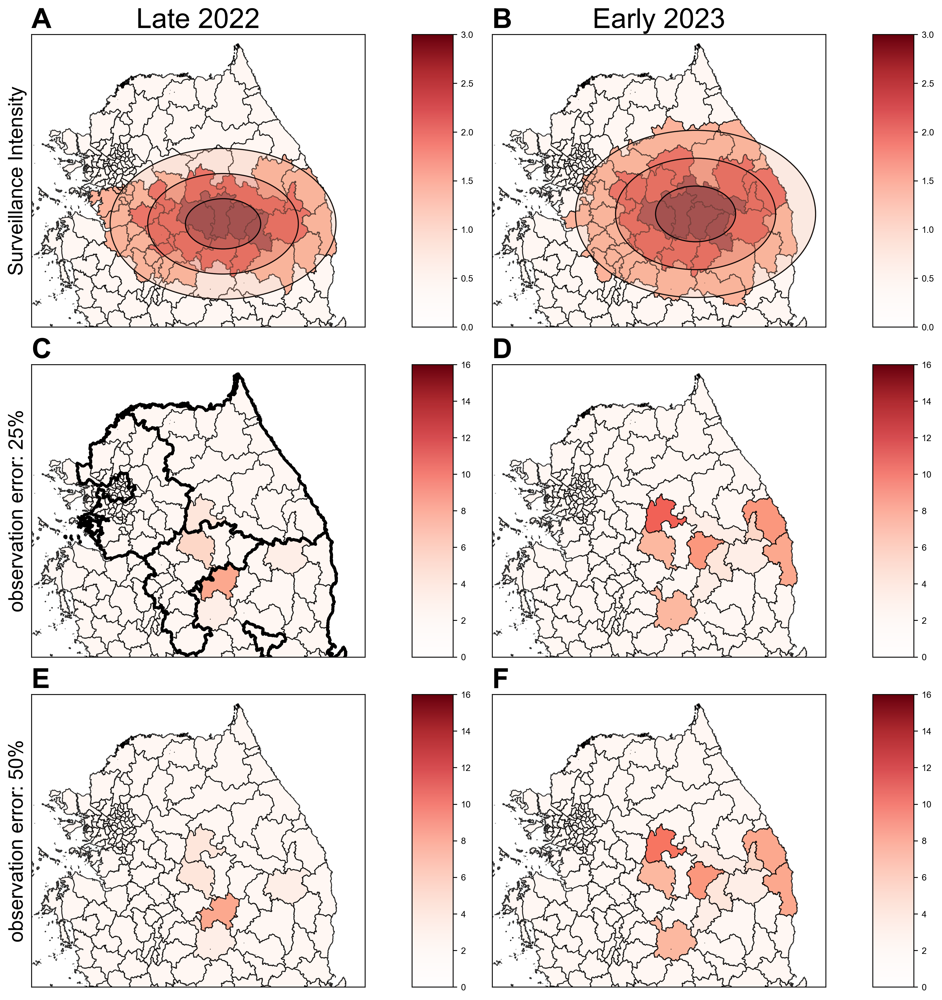

In [5]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec

plt.figure(figsize = (12, 16.5), dpi = set_dpi)
gs1_1 = gridspec.GridSpec(nrows=1, ncols=1, left=0.14, right=0.62, bottom=0.55, top=1)
gs1_2 = gridspec.GridSpec(nrows=1, ncols=1, left=0.52, right=1.0, bottom=0.55, top=1)
gs2_1 = gridspec.GridSpec(nrows=1, ncols=1, left=0.14, right=0.62, bottom=0.30, top=0.75)
gs2_2 = gridspec.GridSpec(nrows=1, ncols=1, left=0.52, right=1.0, bottom=0.30, top=0.75)
gs3_1 = gridspec.GridSpec(nrows=1, ncols=1, left=0.14, right=0.62, bottom=0.05, top=0.5)
gs3_2 = gridspec.GridSpec(nrows=1, ncols=1, left=0.52, right=1.0, bottom=0.05, top=0.5)

ax1 = plt.subplot(gs1_1[0,0])
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='10%', pad=0.1)

korea.plot(column='Period1_intensity', cmap=custom_cmap, linewidth=0.8, ax=ax1, edgecolor='black', legend=True, alpha = 0.8,
              vmin = 0, vmax = 3, cax = cax)

confidence_ellipse(location_2022_2['x'], location_2022_2['y'], ax1, n_std = 3.0, facecolor = '#F3B79E')
confidence_ellipse(location_2022_2['x'], location_2022_2['y'], ax1, n_std = 2.0, facecolor = '#DA6556')
confidence_ellipse(location_2022_2['x'], location_2022_2['y'], ax1, n_std = 1.0, facecolor = '#7D3A3F')
ax1.set_ylabel('Surveillance Intensity', fontsize = 18)
ax1.text(0, 1.09, 'A', transform=ax1.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax1.set_title('Late 2022', fontsize = title_size)
ax1.set_yticks([])
ax1.set_ylim([36,38.7])
ax1.set_xlim([126,129.8])
ax1.set_facecolor('white')

ax2 = plt.subplot(gs1_2[0,0])
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='10%', pad=0.1)
korea.plot(column='Period2_intensity', cmap=custom_cmap, linewidth=0.8, ax=ax2, edgecolor='black', legend=True, alpha = 0.8,
                vmin = 0, vmax = 3, cax = cax)

confidence_ellipse(location_2023_1['x'], location_2023_1['y'], ax2, n_std = 3.0, facecolor = '#F3B79E')
confidence_ellipse(location_2023_1['x'], location_2023_1['y'], ax2, n_std = 2.0, facecolor = '#DA6556')
confidence_ellipse(location_2023_1['x'], location_2023_1['y'], ax2, n_std = 1.0, facecolor = '#7D3A3F')
ax2.set_facecolor('white')
ax2.text(0, 1.09, 'B', transform=ax2.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax2.set_title('Early 2023', fontsize = title_size)
ax2.set_ylim([36,38.7])
ax2.set_xlim([126,129.8])


ax1.xaxis.set_visible(False)
#ax1.yaxis.set_visible(False)
ax2.xaxis.set_visible(False)
ax2.yaxis.set_visible(False)

ax3 = plt.subplot(gs2_1[0,0])
divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='10%', pad=0.1)

korea2.iloc[[8]].plot(ax=ax3, edgecolor='black', facecolor='none', linewidth = 2.5, zorder = 10)
korea2.iloc[[9]].plot(ax=ax3, edgecolor='black', facecolor='none', linewidth = 2.5, zorder = 10)
korea2.iloc[[13]].plot(ax=ax3, edgecolor='black', facecolor='none', linewidth = 2.5, zorder = 10)
korea2.iloc[[16]].plot(ax=ax3, edgecolor='black', facecolor='none', linewidth = 2.5, zorder = 10)

korea.plot(column='2022_car_PS_error1', cmap=custom_cmap, linewidth=0.8, ax=ax3, edgecolor='black', legend=True, cax = cax, alpha = 0.8,
              vmin = 0, vmax = 16)
#ax3.plot(location_2022_9['x'], location_2022_9['y'], 'o', alpha = 0.8, markersize = 5, color = 'blue', label = '2022-09')
#ax3.plot(location_2022_10['x'], location_2022_10['y'], 'o', alpha = 0.8, markersize = 5, color = '#AAD2E4', label = '2022-10')
#ax3.plot(location_2022_11['x'], location_2022_11['y'], 'o', alpha = 0.8, markersize = 5, color = color_year[2], label = '2022-11')
#ax3.plot(location_2022_12['x'], location_2022_12['y'], 'o', alpha = 0.8, markersize = 5, color = 'red', label = '2022-12')
ax3.set_ylim([36,38.7])
ax3.set_xlim([126,129.8])

ax3.set_facecolor('white')
ax3.text(0, 1.09, 'C', transform=ax3.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax3.get_xaxis().set_visible(False)
ax3.set_yticks([])
# ax3.get_yaxis().set_visible(False)
ax3.set_ylabel('observation error: 25%', fontsize = 18)

ax4 = plt.subplot(gs2_2[0,0])
divider = make_axes_locatable(ax4)
cax = divider.append_axes('right', size='10%', pad=0.1)

korea.plot(column='2023_car_PS_error1', cmap=custom_cmap, linewidth=0.8, ax=ax4, edgecolor='black', legend=True, cax=cax, alpha = 0.8,
                vmin = 0, vmax = 16)
#ax4.plot(location_2023_1['x'], location_2023_1['y'], 'o', alpha = 0.8, markersize = 5, color = 'blue', label = '2023-01')
#ax4.plot(location_2023_2['x'], location_2023_2['y'], 'o', alpha = 0.8, markersize = 5, color = '#AAD2E4', label = '2023-02')
#ax4.plot(location_2023_3['x'], location_2023_3['y'], 'o', alpha = 0.8, markersize = 5, color = color_year[2], label = '2023-03')
#ax4.plot(location_2023_4['x'], location_2023_4['y'], 'o', alpha = 0.8, markersize = 5, color = 'red', label = '2023-04')
ax4.set_facecolor('white')
ax4.text(0, 1.09, 'D', transform=ax4.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax4.get_xaxis().set_visible(False)
ax4.get_yaxis().set_visible(False)
ax4.set_ylim([36,38.7])
ax4.set_xlim([126,129.8])


ax5 = plt.subplot(gs3_1[0,0])
divider = make_axes_locatable(ax5)
cax = divider.append_axes('right', size='10%', pad=0.1)

korea.plot(column='2022_car_PS_error2', cmap=custom_cmap, linewidth=0.8, ax=ax5, edgecolor='black', legend=True, cax = cax, alpha = 0.8,
              vmin = 0, vmax = 16)  
#ax5.plot(location_2022_9['x'], location_2022_9['y'], 'o', alpha = 0.8, markersize = 5, color = 'blue', label = '2022-09')
#ax5.plot(location_2022_10['x'], location_2022_10['y'], 'o', alpha = 0.8, markersize = 5, color = '#AAD2E4', label = '2022-10')
#ax5.plot(location_2022_11['x'], location_2022_11['y'], 'o', alpha = 0.8, markersize = 5, color = color_year[2], label = '2022-11')
#ax5.plot(location_2022_12['x'], location_2022_12['y'], 'o', alpha = 0.8, markersize = 5, color = 'red', label = '2022-12')
ax5.set_facecolor('white')
ax5.text(0, 1.09, 'E', transform=ax5.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax5.get_xaxis().set_visible(False)
ax5.set_yticks([])
# ax5.get_yaxis().set_visible(False)
ax5.set_ylabel('observation error: 50%', fontsize = 18)
ax5.set_ylim([36,38.7])
ax5.set_xlim([126,129.8])


ax6 = plt.subplot(gs3_2[0,0])
divider = make_axes_locatable(ax6)
cax = divider.append_axes('right', size='10%', pad=0.1)

korea.plot(column='2023_car_PS_error2', cmap=custom_cmap, linewidth=0.8, ax=ax6, edgecolor='black', legend=True, cax=cax, alpha = 0.8,
                vmin = 0, vmax = 16)
#ax6.plot(location_2023_1['x'], location_2023_1['y'], 'o', alpha = 0.8, markersize = 5, color = 'blue', label = '2023-01')
#ax6.plot(location_2023_2['x'], location_2023_2['y'], 'o', alpha = 0.8, markersize = 5, color = '#AAD2E4', label = '2023-02')
#ax6.plot(location_2023_3['x'], location_2023_3['y'], 'o', alpha = 0.8, markersize = 5, color = color_year[2], label = '2023-03')
#ax6.plot(location_2023_4['x'], location_2023_4['y'], 'o', alpha = 0.8, markersize = 5, color = 'red', label = '2023-04')
ax6.set_facecolor('white')
ax6.text(0, 1.09, 'F', transform=ax6.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax6.get_xaxis().set_visible(False)
ax6.get_yaxis().set_visible(False)
ax6.set_ylim([36,38.7])
ax6.set_xlim([126,129.8])

#ax6.legend(loc = 'upper right', fontsize = 'large')
#ax1.legend(loc = 'upper right', fontsize = 'large')
#ax2.legend(loc = 'upper right', fontsize = 'large')
#ax3.legend(loc = 'upper right', fontsize = 'large')
#ax4.legend(loc = 'upper right', fontsize = 'large')
#ax5.legend(loc = 'upper right', fontsize = 'large')

# plt.savefig(figure_path + 'Figure7.tif', dpi = set_dpi, bbox_inches = 'tight')
plt.show()

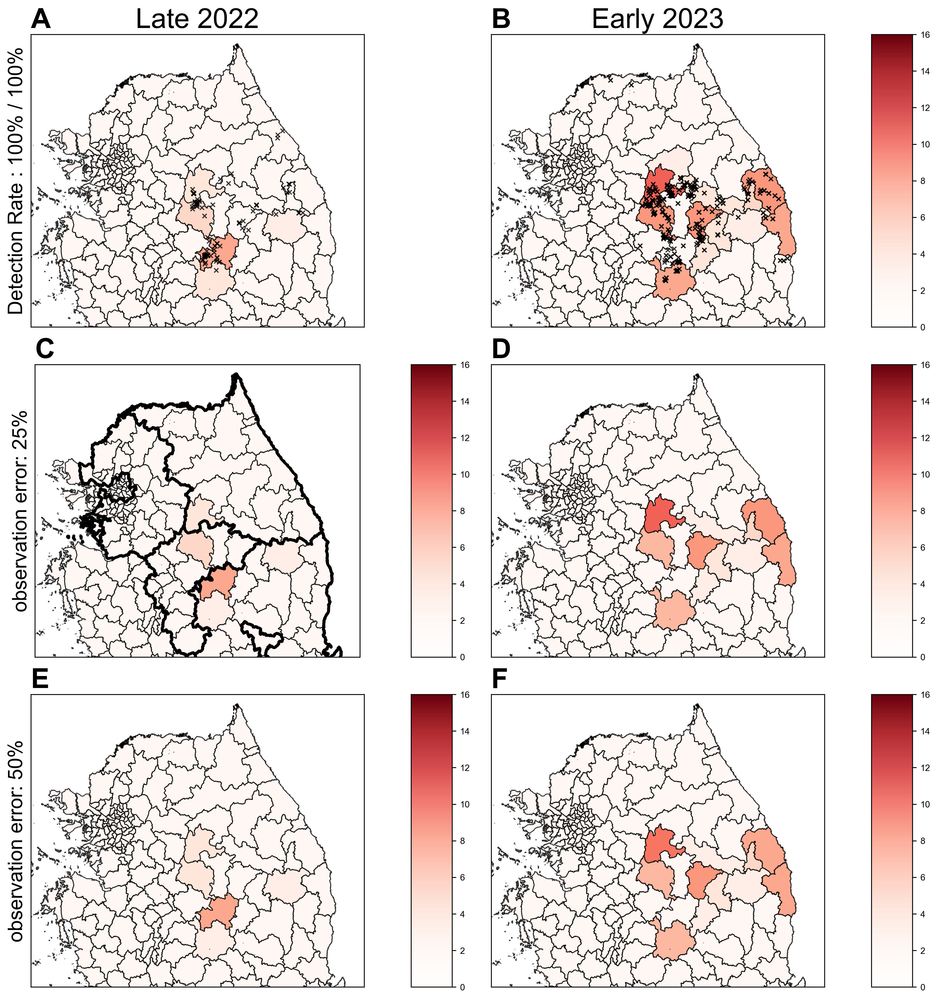

In [17]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec

plt.figure(figsize = (12, 16.5), dpi = set_dpi)
gs1_1 = gridspec.GridSpec(nrows=1, ncols=1, left=0.04, right=0.52, bottom=0.55, top=1)
gs1_2 = gridspec.GridSpec(nrows=1, ncols=1, left=0.52, right=1.0, bottom=0.55, top=1)
gs2_1 = gridspec.GridSpec(nrows=1, ncols=1, left=0.04, right=0.52, bottom=0.30, top=0.75)
gs2_2 = gridspec.GridSpec(nrows=1, ncols=1, left=0.52, right=1.0, bottom=0.30, top=0.75)
gs3_1 = gridspec.GridSpec(nrows=1, ncols=1, left=0.04, right=0.52, bottom=0.05, top=0.5)
gs3_2 = gridspec.GridSpec(nrows=1, ncols=1, left=0.52, right=1.0, bottom=0.05, top=0.5)

ax1 = plt.subplot(gs1_1[0,0])
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='10%', pad=0.1)
korea.plot(column='2022_car_PS', cmap=custom_cmap, linewidth=0.8, ax=ax1, edgecolor='black', legend=True, cax = cax, alpha = 0.8,
           vmin = 0, vmax = 16)
#korea.plot(column='2022_car_PS', cmap=custom_cmap, linewidth=0.8, ax=ax1, edgecolor='black', legend=True, alpha=0.8,
#           vmin=0, vmax=16)

ax1.plot(location_2022_9['x'], location_2022_9['y'], 'x', alpha = 0.8, markersize = 4, color = 'black', label = '2022-09')
ax1.plot(location_2022_10['x'], location_2022_10['y'], 'x', alpha = 0.8, markersize = 4, color = 'black', label = '2022-10')
ax1.plot(location_2022_11['x'], location_2022_11['y'], 'x', alpha = 0.8, markersize = 4, color = 'black', label = '2022-11')
ax1.plot(location_2022_12['x'], location_2022_12['y'], 'x', alpha = 0.8, markersize = 4, color = 'black', label = '2022-12')

#ax1.plot(location_2022_9['x'], location_2022_9['y'], 'o', alpha = 0.8, markersize = 5, color = 'blue', label = '2022-09')
#ax1.plot(location_2022_10['x'], location_2022_10['y'], 'o', alpha = 0.8, markersize = 5, color = '#AAD2E4', label = '2022-10')
#ax1.plot(location_2022_11['x'], location_2022_11['y'], 'o', alpha = 0.8, markersize = 5, color = color_year[2], label = '2022-11')
#ax1.plot(location_2022_12['x'], location_2022_12['y'], 'o', alpha = 0.8, markersize = 5, color = 'red', label = '2022-12')
ax1.set_facecolor('white')
ax1.text(0, 1.09, 'A', transform=ax1.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax1.set_title('Late 2022', fontsize = title_size)
ax1.get_xaxis().set_visible(False)
ax1.set_yticks([])
# ax1.get_yaxis().set_visible(False)
ax1.set_ylabel('Detection Rate : 100% / 100%', fontsize = 18)


ax2 = plt.subplot(gs1_2[0,0])
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='10%', pad=0.1)

korea.plot(column='2023_car_PS', cmap=custom_cmap, linewidth=0.8, ax=ax2, edgecolor='black', legend=True, cax=cax, alpha = 0.8,
                vmin = 0, vmax = 16)
ax2.plot(location_2023_1['x'], location_2023_1['y'], 'x', alpha = 0.8, markersize = 4, color = 'black', label = '2023-01')
ax2.plot(location_2023_2['x'], location_2023_2['y'], 'x', alpha = 0.8, markersize = 4, color = 'black', label = '2023-02')
ax2.plot(location_2023_3['x'], location_2023_3['y'], 'x', alpha = 0.8, markersize = 4, color = 'black', label = '2023-03')
ax2.plot(location_2023_4['x'], location_2023_4['y'], 'x', alpha = 0.8, markersize = 4, color = 'black', label = '2023-04')
#ax2.plot(location_2023_1['x'], location_2023_1['y'], 'o', alpha = 0.8, markersize = 5, color = 'blue', label = '2023-01')
#ax2.plot(location_2023_2['x'], location_2023_2['y'], 'o', alpha = 0.8, markersize = 5, color = '#AAD2E4', label = '2023-02')
#ax2.plot(location_2023_3['x'], location_2023_3['y'], 'o', alpha = 0.8, markersize = 5, color = color_year[2], label = '2023-03')
#ax2.plot(location_2023_4['x'], location_2023_4['y'], 'o', alpha = 0.8, markersize = 5, color = 'red', label = '2023-04')
ax2.set_facecolor('white')
ax2.text(0, 1.09, 'B', transform=ax2.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax2.set_title('Early 2023', fontsize = title_size)
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)

ax3 = plt.subplot(gs2_1[0,0])
divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='10%', pad=0.1)

korea.plot(column='2022_car_PS_error1', cmap=custom_cmap, linewidth=0.8, ax=ax3, edgecolor='black', legend=True, cax = cax, alpha = 0.8,
              vmin = 0, vmax = 16)
#ax3.plot(location_2022_9['x'], location_2022_9['y'], 'o', alpha = 0.8, markersize = 5, color = 'blue', label = '2022-09')
#ax3.plot(location_2022_10['x'], location_2022_10['y'], 'o', alpha = 0.8, markersize = 5, color = '#AAD2E4', label = '2022-10')
#ax3.plot(location_2022_11['x'], location_2022_11['y'], 'o', alpha = 0.8, markersize = 5, color = color_year[2], label = '2022-11')
#ax3.plot(location_2022_12['x'], location_2022_12['y'], 'o', alpha = 0.8, markersize = 5, color = 'red', label = '2022-12')
korea2.iloc[[8]].plot(ax=ax3, edgecolor='black', facecolor='none', linewidth = 2.5)
korea2.iloc[[9]].plot(ax=ax3, edgecolor='black', facecolor='none', linewidth = 2.5)
korea2.iloc[[13]].plot(ax=ax3, edgecolor='black', facecolor='none', linewidth = 2.5)
korea2.iloc[[16]].plot(ax=ax3, edgecolor='black', facecolor='none', linewidth = 2.5)
ax3.set_facecolor('white')
ax3.text(0, 1.09, 'C', transform=ax3.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax3.get_xaxis().set_visible(False)
ax3.set_yticks([])
# ax3.get_yaxis().set_visible(False)
ax3.set_ylabel('observation error: 25%', fontsize = 18)

ax4 = plt.subplot(gs2_2[0,0])
divider = make_axes_locatable(ax4)
cax = divider.append_axes('right', size='10%', pad=0.1)

korea.plot(column='2023_car_PS_error1', cmap=custom_cmap, linewidth=0.8, ax=ax4, edgecolor='black', legend=True, cax=cax, alpha = 0.8,
                vmin = 0, vmax = 16)
#ax4.plot(location_2023_1['x'], location_2023_1['y'], 'o', alpha = 0.8, markersize = 5, color = 'blue', label = '2023-01')
#ax4.plot(location_2023_2['x'], location_2023_2['y'], 'o', alpha = 0.8, markersize = 5, color = '#AAD2E4', label = '2023-02')
#ax4.plot(location_2023_3['x'], location_2023_3['y'], 'o', alpha = 0.8, markersize = 5, color = color_year[2], label = '2023-03')
#ax4.plot(location_2023_4['x'], location_2023_4['y'], 'o', alpha = 0.8, markersize = 5, color = 'red', label = '2023-04')
ax4.set_facecolor('white')
ax4.text(0, 1.09, 'D', transform=ax4.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax4.get_xaxis().set_visible(False)
ax4.get_yaxis().set_visible(False)

ax5 = plt.subplot(gs3_1[0,0])
divider = make_axes_locatable(ax5)
cax = divider.append_axes('right', size='10%', pad=0.1)

korea.plot(column='2022_car_PS_error2', cmap=custom_cmap, linewidth=0.8, ax=ax5, edgecolor='black', legend=True, cax = cax, alpha = 0.8,
              vmin = 0, vmax = 16)  
#ax5.plot(location_2022_9['x'], location_2022_9['y'], 'o', alpha = 0.8, markersize = 5, color = 'blue', label = '2022-09')
#ax5.plot(location_2022_10['x'], location_2022_10['y'], 'o', alpha = 0.8, markersize = 5, color = '#AAD2E4', label = '2022-10')
#ax5.plot(location_2022_11['x'], location_2022_11['y'], 'o', alpha = 0.8, markersize = 5, color = color_year[2], label = '2022-11')
#ax5.plot(location_2022_12['x'], location_2022_12['y'], 'o', alpha = 0.8, markersize = 5, color = 'red', label = '2022-12')
ax5.set_facecolor('white')
ax5.text(0, 1.09, 'E', transform=ax5.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax5.get_xaxis().set_visible(False)
ax5.set_yticks([])
# ax5.get_yaxis().set_visible(False)
ax5.set_ylabel('observation error: 50%', fontsize = 18)

ax6 = plt.subplot(gs3_2[0,0])
divider = make_axes_locatable(ax6)
cax = divider.append_axes('right', size='10%', pad=0.1)

korea.plot(column='2023_car_PS_error2', cmap=custom_cmap, linewidth=0.8, ax=ax6, edgecolor='black', legend=True, cax=cax, alpha = 0.8,
                vmin = 0, vmax = 16)
#ax6.plot(location_2023_1['x'], location_2023_1['y'], 'o', alpha = 0.8, markersize = 5, color = 'blue', label = '2023-01')
#ax6.plot(location_2023_2['x'], location_2023_2['y'], 'o', alpha = 0.8, markersize = 5, color = '#AAD2E4', label = '2023-02')
#ax6.plot(location_2023_3['x'], location_2023_3['y'], 'o', alpha = 0.8, markersize = 5, color = color_year[2], label = '2023-03')
#ax6.plot(location_2023_4['x'], location_2023_4['y'], 'o', alpha = 0.8, markersize = 5, color = 'red', label = '2023-04')
ax6.set_facecolor('white')
ax6.text(0, 1.09, 'F', transform=ax6.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax6.get_xaxis().set_visible(False)
ax6.get_yaxis().set_visible(False)

ax6.set_ylim([36,38.7])
ax6.set_xlim([126,129.8])
ax1.set_ylim([36,38.7])
ax1.set_xlim([126,129.8])
ax2.set_ylim([36,38.7])
ax2.set_xlim([126,129.8])
ax3.set_ylim([36,38.7])
ax3.set_xlim([126,129.8])
ax4.set_ylim([36,38.7])
ax4.set_xlim([126,129.8])
ax5.set_ylim([36,38.7])
ax5.set_xlim([126,129.8])

#ax6.legend(loc = 'upper right', fontsize = 'large')
#ax1.legend(loc = 'upper right', fontsize = 'large')
#ax2.legend(loc = 'upper right', fontsize = 'large')
#ax3.legend(loc = 'upper right', fontsize = 'large')
#ax4.legend(loc = 'upper right', fontsize = 'large')
#ax5.legend(loc = 'upper right', fontsize = 'large')

# plt.savefig(figure_path + 'Figure7.tif', dpi = set_dpi, bbox_inches = 'tight')
plt.show()

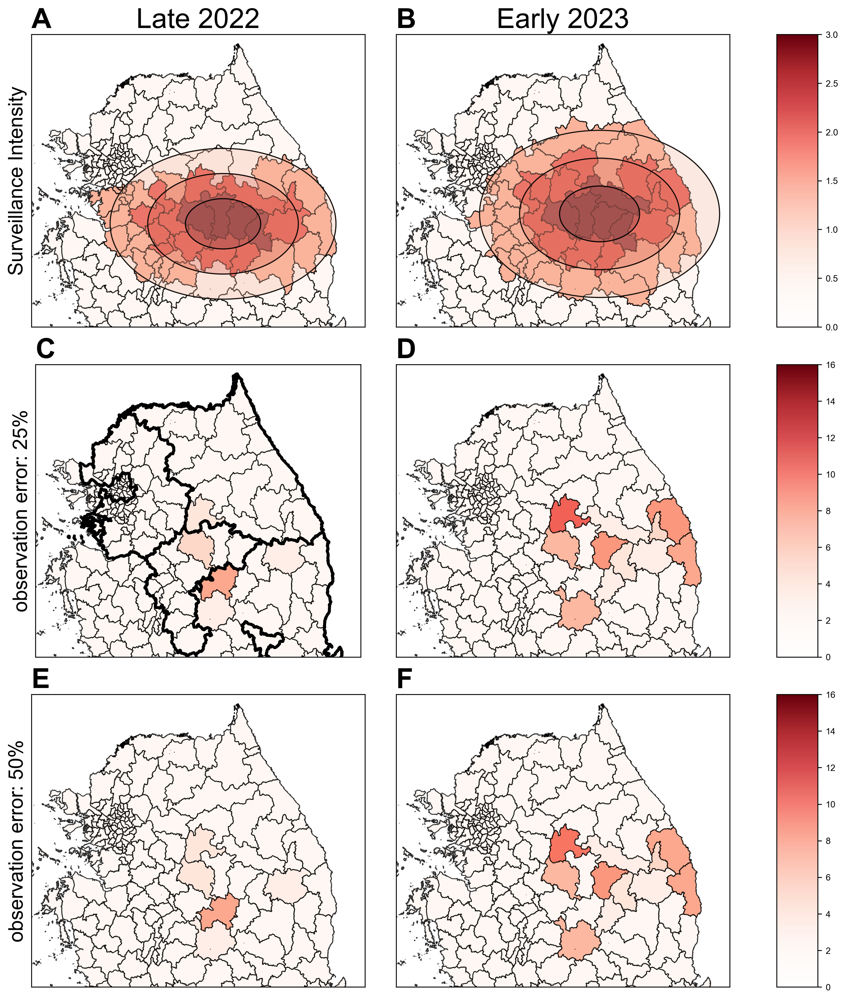

In [19]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec

plt.figure(figsize=(12, 16.5), dpi=set_dpi)
gs1_1 = gridspec.GridSpec(nrows=1, ncols=1, left=0.14, right=0.62, bottom=0.55, top=1)
gs1_2 = gridspec.GridSpec(nrows=1, ncols=1, left=0.52, right=1.0, bottom=0.55, top=1)
gs2_1 = gridspec.GridSpec(nrows=1, ncols=1, left=0.14, right=0.62, bottom=0.30, top=0.75)
gs2_2 = gridspec.GridSpec(nrows=1, ncols=1, left=0.52, right=1.0, bottom=0.30, top=0.75)
gs3_1 = gridspec.GridSpec(nrows=1, ncols=1, left=0.14, right=0.62, bottom=0.05, top=0.5)
gs3_2 = gridspec.GridSpec(nrows=1, ncols=1, left=0.52, right=1.0, bottom=0.05, top=0.5)

ax1 = plt.subplot(gs1_1[0,0])
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='10%', pad=0.1)

korea.plot(column='Period1_intensity', cmap=custom_cmap, linewidth=0.8, ax=ax1, edgecolor='black', legend=True, alpha = 0.8,
              vmin = 0, vmax = 3, cax = cax)

confidence_ellipse(location_2022_2['x'], location_2022_2['y'], ax1, n_std = 3.0, facecolor = '#F3B79E')
confidence_ellipse(location_2022_2['x'], location_2022_2['y'], ax1, n_std = 2.0, facecolor = '#DA6556')
confidence_ellipse(location_2022_2['x'], location_2022_2['y'], ax1, n_std = 1.0, facecolor = '#7D3A3F')
ax1.set_ylabel('Surveillance Intensity', fontsize = 18)
ax1.text(0, 1.09, 'A', transform=ax1.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax1.set_title('Late 2022', fontsize = title_size)
ax1.set_yticks([])
ax1.set_ylim([36,38.7])
ax1.set_xlim([126,129.8])
ax1.set_facecolor('white')
cax.remove() 

ax2 = plt.subplot(gs1_2[0,0])
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='10%', pad=0.1)
korea.plot(column='Period2_intensity', cmap=custom_cmap, linewidth=0.8, ax=ax2, edgecolor='black', legend=True, alpha = 0.8,
                vmin = 0, vmax = 3, cax = cax)

confidence_ellipse(location_2023_1['x'], location_2023_1['y'], ax2, n_std = 3.0, facecolor = '#F3B79E')
confidence_ellipse(location_2023_1['x'], location_2023_1['y'], ax2, n_std = 2.0, facecolor = '#DA6556')
confidence_ellipse(location_2023_1['x'], location_2023_1['y'], ax2, n_std = 1.0, facecolor = '#7D3A3F')
ax2.set_facecolor('white')
ax2.text(0, 1.09, 'B', transform=ax2.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax2.set_title('Early 2023', fontsize = title_size)
ax2.set_ylim([36,38.7])
ax2.set_xlim([126,129.8])


ax1.xaxis.set_visible(False)
#ax1.yaxis.set_visible(False)
ax2.xaxis.set_visible(False)
ax2.yaxis.set_visible(False)

# ax3
ax3 = plt.subplot(gs2_1[0, 0])
divider3 = make_axes_locatable(ax3)
cax3 = divider3.append_axes('right', size='10%', pad=0.1)
korea.plot(column='2022_car_PS_error1', cmap=custom_cmap, linewidth=0.8, ax=ax3, edgecolor='black', legend=True, cax=cax3, alpha=0.8,
           vmin=0, vmax=16)
cax3.remove()  # 컬러바 제거

korea2.iloc[[8]].plot(ax=ax3, edgecolor='black', facecolor='none', linewidth=2.5)
korea2.iloc[[9]].plot(ax=ax3, edgecolor='black', facecolor='none', linewidth=2.5)
korea2.iloc[[13]].plot(ax=ax3, edgecolor='black', facecolor='none', linewidth=2.5)
korea2.iloc[[16]].plot(ax=ax3, edgecolor='black', facecolor='none', linewidth=2.5)

ax3.set_facecolor('white')
ax3.text(0, 1.09, 'C', transform=ax3.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax3.get_xaxis().set_visible(False)
ax3.set_yticks([])
ax3.set_ylabel('Observation error: 25%', fontsize=18)

# ax4
ax4 = plt.subplot(gs2_2[0, 0])
divider4 = make_axes_locatable(ax4)
cax4 = divider4.append_axes('right', size='10%', pad=0.1)

korea.plot(column='2023_car_PS_error1', cmap=custom_cmap, linewidth=0.8, ax=ax4, edgecolor='black', legend=True, cax=cax4, alpha=0.8,
           vmin=0, vmax=16)

ax4.set_facecolor('white')
ax4.text(0, 1.09, 'D', transform=ax4.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax4.get_xaxis().set_visible(False)
ax4.get_yaxis().set_visible(False)

# ax5
ax5 = plt.subplot(gs3_1[0, 0])
divider5 = make_axes_locatable(ax5)
cax5 = divider5.append_axes('right', size='10%', pad=0.1)
korea.plot(column='2022_car_PS_error2', cmap=custom_cmap, linewidth=0.8, ax=ax5, edgecolor='black', legend=True, cax=cax5, alpha=0.8,
           vmin=0, vmax=16)
cax5.remove()  # 컬러바 제거

ax5.set_facecolor('white')
ax5.text(0, 1.09, 'E', transform=ax5.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax5.get_xaxis().set_visible(False)
ax5.set_yticks([])
ax5.set_ylabel('Observation error: 50%', fontsize=18)

# ax6
ax6 = plt.subplot(gs3_2[0, 0])
divider6 = make_axes_locatable(ax6)
cax6 = divider6.append_axes('right', size='10%', pad=0.1)

korea.plot(column='2023_car_PS_error2', cmap=custom_cmap, linewidth=0.8, ax=ax6, edgecolor='black', legend=True, cax=cax6, alpha=0.8,
           vmin=0, vmax=16)

ax6.set_facecolor('white')
ax6.text(0, 1.09, 'F', transform=ax6.transAxes, fontsize=title_size, fontweight='bold', va='top', ha='left')
ax6.get_xaxis().set_visible(False)
ax6.get_yaxis().set_visible(False)

ax6.set_ylim([36, 38.7])
ax6.set_xlim([126, 129.8])
ax1.set_ylim([36, 38.7])
ax1.set_xlim([126, 129.8])
ax2.set_ylim([36, 38.7])
ax2.set_xlim([126, 129.8])
ax3.set_ylim([36, 38.7])
ax3.set_xlim([126, 129.8])
ax4.set_ylim([36, 38.7])
ax4.set_xlim([126, 129.8])
ax5.set_ylim([36, 38.7])
ax5.set_xlim([126, 129.8])

plt.show()